<a href="https://colab.research.google.com/github/JRiveraB23/SyS05/blob/main/Parcial_3_2023.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ***PARCIAL #3***

1. Encuentre la funcion de transferencia que caracteriza el sistema masa, resorte, amortiguador, presentado en la siguiente Figura (asuma condiciones iniciales cero):

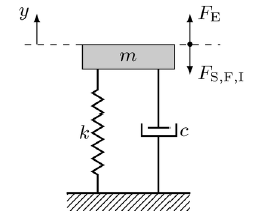

Posteriormente, encuentre el sistema equivalente del modelo masa, resorte, amortiguador, a partir del siguiente circuito electrico:

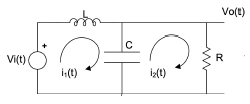

Finalmente, proponga unos valores de m, k y c y sus equivalentes R, L y C, para simular un sistema subamortiguado sobreamortiguado, y de amortiguamiento crıtico (determine el factor de amortiguamiento, la frecuencia natural amortiguada, la frecuencia natural no amortiguada, el tiempo pico, tiempo de levantamiento y el tiempo de establecimiento en cada caso). Para cada caso, grafique el diagrama de polos y
ceros, el diagrama de Bode, la respuesta impulso, respuesta escalon y respuesta rampa. Repita el proceso para modo lazo
cerrado.





# Solución

El sistema masa, resorte y amortiguador se puede modelar a partir de la conservación de fuerzas:

 **Conservación de fuerzas:**
   La suma de las fuerzas en el sistema es igual a la fuerza externa aplicada:
$$
F_\text{S}(t) + F_\text{F}(t) + F_\text{I}(t) = F_\text{E}(t)
$$

donde $F_\text{S}(t) = k y(t)$, es la fuerza ejercida por el resorte

$F_\text{F}(t) = c \frac{d y(t)}{dt}$ es la fuerza debida al amortiguador,

, y $F_\text{I}(t) = m \frac{d^2 y(t)}{dt^2}$ es la fuerza inercial debido a la masa,.

Por consiguiente, sustituimos y obtenemos la ecuacion de movimiento del sistema:

$$ m\frac{d^2 y(t)}{dt^2} + c \frac{d y(t)}{dt} + k y(t) = F_\text{E}(t) = x(t)$$

Aplicando la transformada de Laplace a la ecuación de movimiento, utilizando la propiedad de la transformada de Laplace para derivadas, se obtiene: $\mathfrak{L}\left\{\frac{d^nx(t)}{dt}\right\}=s^nX(s)$, tenemos que:

$$ms^2Y(s)+csY(s)+kY(s)=X(s)$$

Rearreglando la ecuación anterior para aislar
Y(s), se obtiene la función de transferencia
H(s):

$$\boxed{H(s) = \frac{Y(s)}{X(s)}=\frac{1}{ms^2+cs+k}}$$

Ahora, para el circuito eléctrico presentdo, y utilizando impedancias transformadas, tenemos las siguientes ecuaciones para el circuito eléctrico:

$$V_i(s)=LsI_1(s)+(I_1(s)-I_2(s))\frac{1}{cs}$$

$$(I_2(s)-I_1(s))\frac{1}{cs}+I_2(s)R = 0$$

$$V_o(s) = R I_2(s)$$

Despejando $I_1(s)$ respecto a $I_2(s)$:

$$\frac{1}{cs}I_2(s)-\frac{1}{cs}I_1(s) + I_2(s)R = 0 $$

$$\boxed{I_1(s) = I_2(s)(1+CRs)}$$

Reemplazando respecto a la primera ecuación:

$$V_i(s)=LsI_2(s)(1+CRs)+(I_2(s)(1+CRs)-I_2(s))\frac{1}{Cs}$$

$$V_i(s) = LsI_2(s)+CRLs^2I_2(s)+I_2(s)
\frac{1}{Cs}+I_2(s)R-I_2(s)\frac{1}{Cs}$$
Factorizamos
I
2
​
 (s) de la expresión resultante:
$$V_i(s) = I_2(s)(CRLs^2+Ls+R)$$
Obtenemos la función de transferencia
H(s) al dividir la transformada de Laplace de la salida (
V
o
​
 (s)) por la transformada de Laplace de la entrada (
V
i
​
 (s)):
$$\frac{I_2(s)}{V_i(s)}=\frac{1}{CRLs^2+Ls+R}$$

Multiplicamos por
R para obtener la relación entre
V
o
​
 (s) y
V
i
​
 (s):
$$\frac{RI_2(s)}{V_i(s)}=\frac{V_o(s)}{V_i(s)}=\frac{R}{CRLs^2+Ls+R}$$

Factorizamos el denominador final de la función de transferencia:


$$\boxed{H(s)=\frac{V_o(s)}{V_i(s)}=\frac{1}{CLs^2+\frac{L}{R}s+1}}$$
Esta es la forma final de la función de transferencia del circuito eléctrico en el dominio de Laplace.

In [1]:
!pip install sympy --upgrade #actualizar sympy para usar módulo de control

In [2]:
%matplotlib inline
#importar numpy, matplotlib, sympy
import numpy as np
import matplotlib.pyplot as plt
import sympy as sym
sym.init_printing()
#definir variables
t, m, c, k = sym.symbols('t m c k', real=True,positive=True)
s = sym.symbols('s', complex=True)

Teniendo en cuenta la forma canónica: representamos la función de transferencia \(H(s)\) de un sistema lineal e invariante en el tiempo. La segunda fórmula es una expresión específica para sistemas de segundo orden con amortiguamiento, donde \(K\) es la ganancia, \(\omega_n\) es la frecuencia natural no amortiguada, y \(\xi\) es el coeficiente de amortiguamiento. Estas fórmulas son utilizadas en el análisis de sistemas dinámicos, especialmente en el campo del control automático.
$$H(s)=\frac{1}{a_2s^2+a_1s+a_0}$$

$$H(s)=K\frac{\omega_n^2}{s^2+2\xi \omega_ns+\omega_n^2}$$


In [3]:
#forma canónica del slit
a2 = m #CL en circuito equivalente
a1 = c #L/R en circuito equivalente
ao = k # 1 en circuito equivalente

Ko = 1/ao #ganancia circuito forma canónica
wn = sym.sqrt(ao/a2)
xi = a1/(2*sym.sqrt(ao*a2))

#función de transferencia
H = Ko*wn**2/(s**2+2*xi*wn*s+wn**2)
H

       1        
────────────────
  ⎛c⋅s   k    2⎞
m⋅⎜─── + ─ + s ⎟
  ⎝ m    m     ⎠

 Calculamos la primera raíz (polo) de la ecuación característica asociada a un sistema de segundo orden, utilizando la biblioteca SymPy en Python. Esta raíz es crucial para el análisis de la respuesta transitoria del sistema y está expresada en términos de símbolos como el coeficiente de amortiguamiento (xi) y la frecuencia natural no amortiguada (wn).

In [4]:
#calcular polos
p1 = -xi*wn + 1j*wn*sym.sqrt(1-xi**2)
p2 = -xi*wn - 1j*wn*sym.sqrt(1-xi**2)
p1

                      _____________
                     ╱      2      
                    ╱      c       
        1.0⋅ⅈ⋅√k⋅  ╱   - ───── + 1 
   c             ╲╱      4⋅k⋅m     
- ─── + ───────────────────────────
  2⋅m                √m            

# Para un sistema subamortiguado

Ahora, para sistema un subamortiguado se establecen relaciones entre los parámetros del sistema, como la capacitancia, inductancia, resistencia y constante del resorte. Además, se calculan los valores específicos de estos parámetros para un conjunto de condiciones dadas. El sistema se considera subamortiguado con un coeficiente de amortiguamiento \(\xi\) en el rango de 0 a 1, y se ha calculado \(\xi\) para el sistema con valores particulares de \(L\), \(R\), y \(C\).

$$0<\xi<1$$

$$0<\frac{c}{2\sqrt{k m}}<1$$

Asumimos: $L = 1$, $R=1$, $C=4$ y calculamos los valores de m,c y k a partir de la tabla:


|                         | Circuito RLC | Péndulo elástico                          |
|-------------------------|------------------------------------|-------------------------------------------|
                            |
|                         | $CL$                              | $m$                                     |
|                         | $L/R$                              | $c$                                     |
|                         | $1$                    | $k$                           |

$$k=1$$

$$c=\frac{L}{R} = 1$$

$$m=CL = 4$$



$$\xi =\frac{1}{2\sqrt{1*4}}= \frac{1}{4}=0.25$$


Definimos un diccionario llamado mck que asocia variasbles simbolicas con valores

In [5]:
mck = {m: 4.0, c: 1.0, k: 1.0}
mck

{c: 1.0, k: 1.0, m: 4.0}

## Polos y ceros

In [6]:
print('p1=',p1.subs(mck))
print('p2=',p2.subs(mck))
print('xi=',xi.subs(mck))
print('omega_n=',wn.subs(mck))

p1= -0.125 + 0.484122918275927*I
p2= -0.125 - 0.484122918275927*I
xi= 0.250000000000000
omega_n= 0.500000000000000


Se crea y muestra un diagrama de polos y ceros para una función de transferencia específica (\(H(s)\)) que modela un sistema dinámico subamortiguado. Se utilizan valores específicos para la masa, el coeficiente de amortiguamiento y la constante del resorte en la función de transferencia, y el diagrama de polos y ceros proporciona información visual sobre la estabilidad y comportamiento dinámico del sistema.

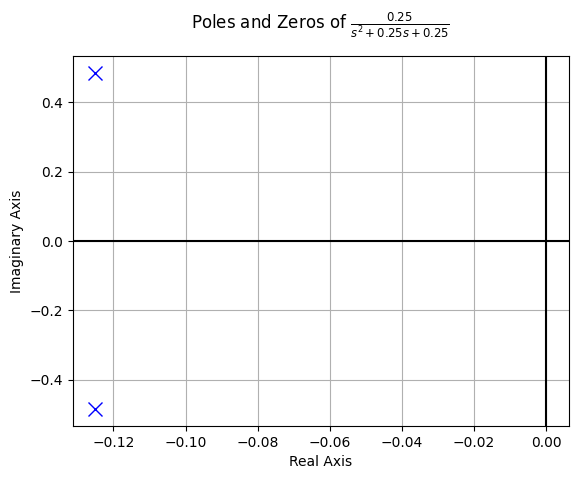

In [7]:
#gráfica polos y ceros paquete de control de sympy
from sympy.physics.control.lti import TransferFunction
from sympy.physics.control.control_plots import pole_zero_plot, bode_plot, impulse_response_plot, step_response_plot, ramp_response_plot
num,den=sym.fraction(H.subs(mck))

tf1 = TransferFunction(num, den, s)#numerados y denomirador función de transferencia con valores evaluados de RLC
pole_zero_plot(tf1)

## Diagrama de Bode

Se proporciona una visualización del comportamiento en frecuencia de la función de transferencia del sistema subamortiguado, lo que es útil para entender la ganancia y la fase.








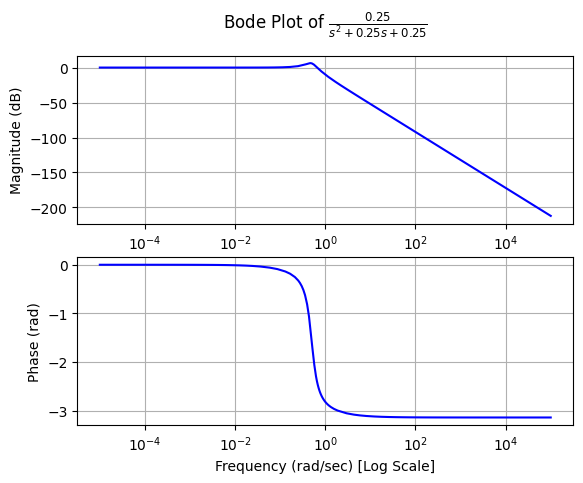

In [8]:
bode_plot(tf1)

## Respuesta impulso

El sistema responde a un impulso unitario a lo largo del tiempo, lo que es útil para comprender la dinámica temporal del sistema subamortiguado modelado por la función de transferencia.

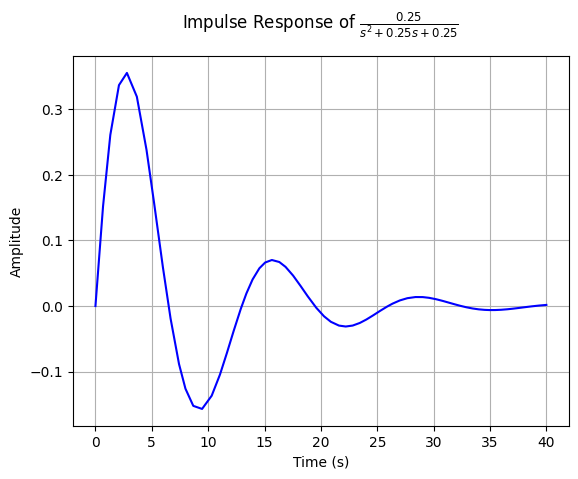

In [9]:
impulse_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

# Respuesta al escalón

El sistema responde a una entrada de escalón unitario a lo largo del tiempo, lo que es útil para comprender la dinámica temporal y la estabilidad del sistema subamortiguado modelado por la función de transferencia.

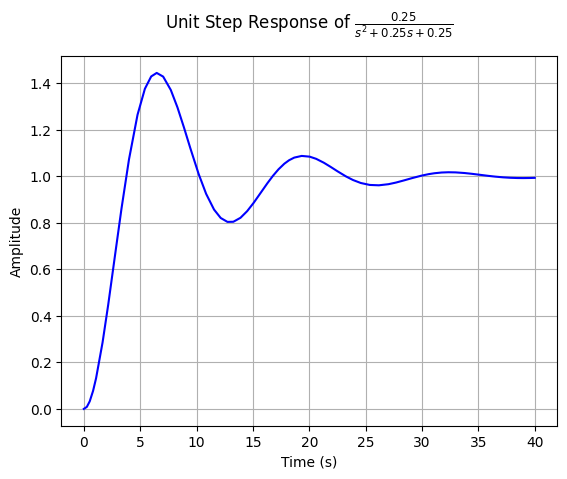

In [10]:
step_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

# Respuesta rampa

El sistema responde a una entrada de rampa unitaria a lo largo del tiempo, lo que es útil para analizar la dinámica temporal del sistema subamortiguado modelado por la función de transferencia.

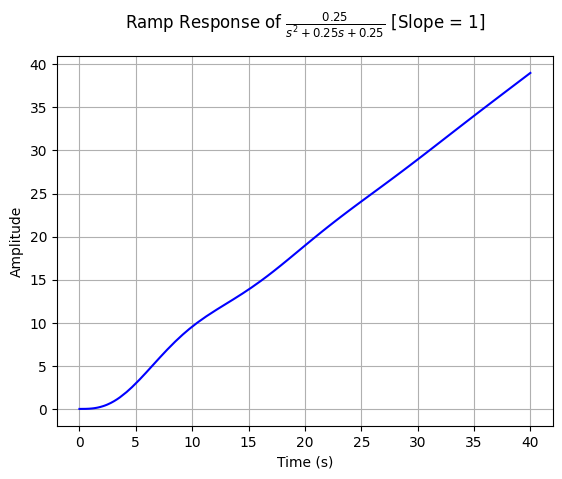

In [11]:
ramp_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

# Para un sistema sobreamortiguado

Ahora, para un sistema subreamortiguado de un circuito RLC, estableciendo las relaciones entre la capacitancia, inductancia, resistencia y constante del resorte, y calculando el coeficiente de amortiguamiento para el sistema con valores específicos de
L,
R, y
C.








$$\xi>1$$

$$\frac{c}{2\sqrt{k m}}>1$$

Asumimos: $L = 10$, $R=2$, $C=0.4$ y calculamos los valores de m,c y k a partir de la tabla:


|                         | Circuito RLC | Péndulo elástico                          |
|-------------------------|------------------------------------|-------------------------------------------|
                            |
|                         | $CL$                              | $m$                                     |
|                         | $L/R$                              | $c$                                     |
|                         | $1$                    | $k$                           |

$$k=1$$

$$c=\frac{L}{R} = 5$$

$$m=CL = 4$$



$$\xi =\frac{5}{2\sqrt{1*4}}= \frac{5}{4}=1.25$$


Definimos un diccionario llamado mck que asocia variasbles simbolicas con valores

In [12]:
#Reemplazando los valores
mck = {m: 4.0, c: 5.0, k: 1.0}
mck

{c: 5.0, k: 1.0, m: 4.0}

In [13]:
#forma canónica del slit
a2 = m #CL en circuito equivalente
a1 = c #L/R en circuito equivalente
ao = k # 1 en circuito equivalente

Ko = 1/ao #ganancia circuito forma canónica
wn = sym.sqrt(ao/a2)
xi = a1/(2*sym.sqrt(ao*a2))
#función de transferencia
H = Ko*wn**2/(s**2+2*xi*wn*s+wn**2)
H

       1        
────────────────
  ⎛c⋅s   k    2⎞
m⋅⎜─── + ─ + s ⎟
  ⎝ m    m     ⎠

In [14]:
#calcular polos
p1 = -xi*wn + 1j*wn*sym.sqrt(1-xi**2)
p2 = -xi*wn - 1j*wn*sym.sqrt(1-xi**2)
p1

                      _____________
                     ╱      2      
                    ╱      c       
        1.0⋅ⅈ⋅√k⋅  ╱   - ───── + 1 
   c             ╲╱      4⋅k⋅m     
- ─── + ───────────────────────────
  2⋅m                √m            

SE Proporciona información sobre los polos, coeficientes y una representación visual de los polos y ceros de la función de transferencia de un sistema subamortiguado con valores específicos para
L,
R, y
C.








p1= -1.00000000000000
p2= -0.250000000000000
xi= 1.25000000000000
omega_n= 0.500000000000000


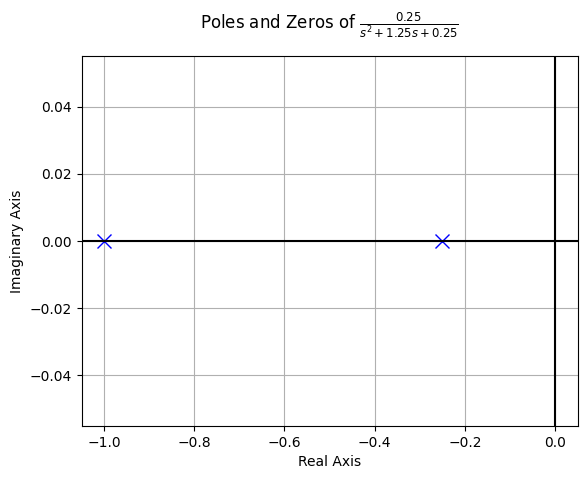

In [15]:
print('p1=',p1.subs(mck))
print('p2=',p2.subs(mck))
print('xi=',xi.subs(mck))
print('omega_n=',wn.subs(mck))

#gráfica polos y ceros paquete de control de sympy
from sympy.physics.control.lti import TransferFunction
from sympy.physics.control.control_plots import pole_zero_plot, bode_plot, impulse_response_plot, step_response_plot
num,den=sym.fraction(H.subs(mck))

tf1 = TransferFunction(num, den, s)#numerados y denomirador función de transferencia con valores evaluados de RLC
pole_zero_plot(tf1)

Se proporciona una visualización del comportamiento en frecuencia de la función de transferencia del sistema subreamortiguado, lo que es útil para entender la ganancia y la fase.








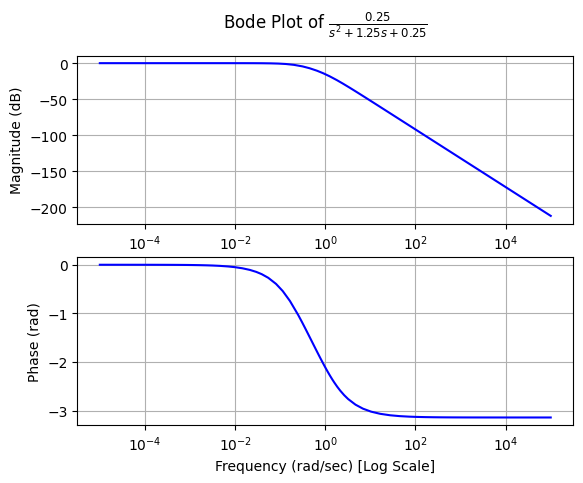

In [16]:
bode_plot(tf1)

El sistema responde a un impulso unitario a lo largo del tiempo, lo que es útil para comprender la dinámica temporal del sistema sobreamortiguado modelado por la función de transferencia.

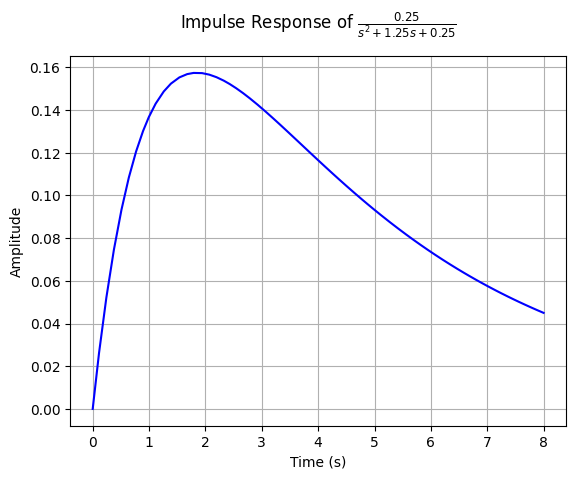

In [17]:
impulse_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

El sistema responde a una entrada de escalón unitario a lo largo del tiempo, lo que es útil para comprender la dinámica temporal y la estabilidad del sistema subreamortiguado modelado por la función de transferencia.

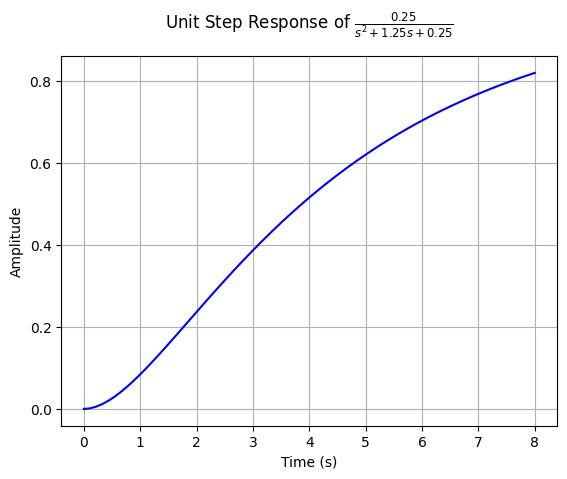

In [18]:
step_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

El sistema responde a una entrada de rampa unitaria a lo largo del tiempo, lo que es útil para analizar la dinámica temporal del sistema subreamortiguado modelado por la función de transferencia.

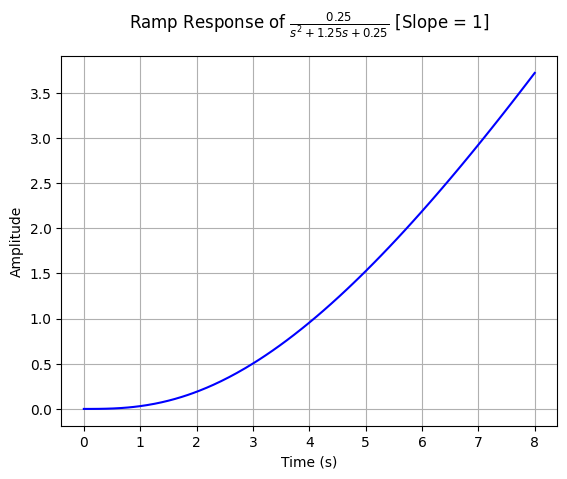

In [19]:
ramp_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

# Para un sistema de amortiguamiento crítico

Ahora, para un sistema de amortiguamiento crítico:

$$\xi=1$$

$$\frac{c}{2\sqrt{k m}}=1$$

Asumimos: $L = 8$, $R=2$, $C=0.5$ y calculamos los valores de m,c y k a partir de la tabla:


|                         | Circuito RLC | Péndulo elástico                          |
|-------------------------|------------------------------------|-------------------------------------------|
                            |
|                         | $CL$                              | $m$                                     |
|                         | $L/R$                              | $c$                                     |
|                         | $1$                    | $k$                           |

$$k=1$$

$$c=\frac{L}{R} = 4$$

$$m=CL = 4$$



$$\xi =\frac{4}{2\sqrt{1*4}}= 1$$


In [20]:
#Reemplazando los valores
mck = {m: 4.0, c: 4.0, k: 1.0}
mck

{c: 4.0, k: 1.0, m: 4.0}

In [21]:
#forma canónica del slit
a2 = m #CL en circuito equivalente
a1 = c #L/R en circuito equivalente
ao = k # 1 en circuito equivalente

Ko = 1/ao #ganancia circuito forma canónica
wn = sym.sqrt(ao/a2)
xi = a1/(2*sym.sqrt(ao*a2))
#función de transferencia
H = Ko*wn**2/(s**2+2*xi*wn*s+wn**2)
H

       1        
────────────────
  ⎛c⋅s   k    2⎞
m⋅⎜─── + ─ + s ⎟
  ⎝ m    m     ⎠

In [22]:
#calcular polos
p1 = -xi*wn + 1j*wn*sym.sqrt(1-xi**2)
p2 = -xi*wn - 1j*wn*sym.sqrt(1-xi**2)
p1

                      _____________
                     ╱      2      
                    ╱      c       
        1.0⋅ⅈ⋅√k⋅  ╱   - ───── + 1 
   c             ╲╱      4⋅k⋅m     
- ─── + ───────────────────────────
  2⋅m                √m            

p1= -0.500000000000000
p2= -0.500000000000000
xi= 1.00000000000000
omega_n= 0.500000000000000


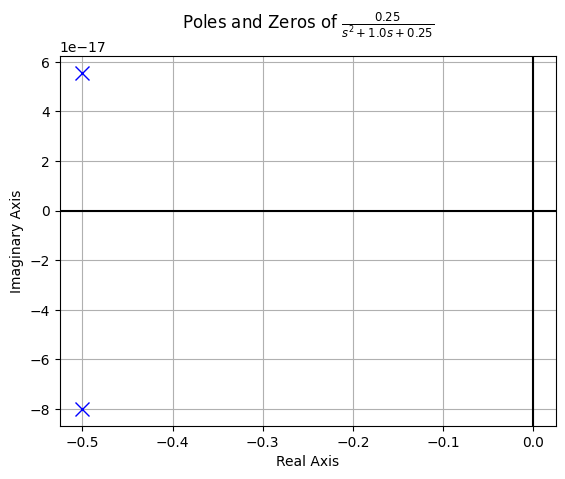

In [23]:
print('p1=',p1.subs(mck))
print('p2=',p2.subs(mck))
print('xi=',xi.subs(mck))
print('omega_n=',wn.subs(mck))

#gráfica polos y ceros paquete de control de sympy
from sympy.physics.control.lti import TransferFunction
from sympy.physics.control.control_plots import pole_zero_plot, bode_plot, impulse_response_plot, step_response_plot
num,den=sym.fraction(H.subs(mck))

tf1 = TransferFunction(num, den, s)#numerados y denomirador función de transferencia con valores evaluados de RLC
pole_zero_plot(tf1)

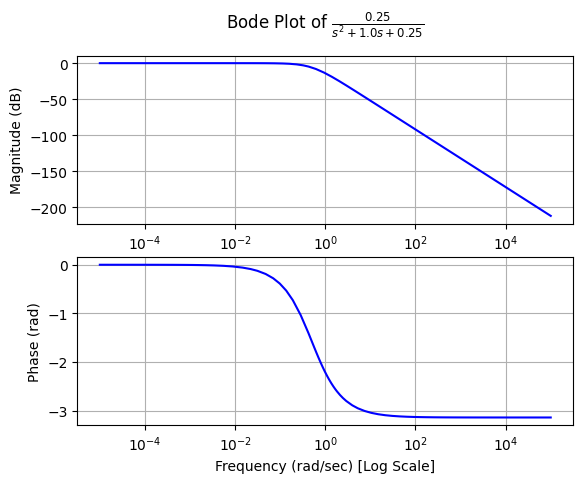

In [24]:
bode_plot(tf1)

El sistema responde a un impulso unitario a lo largo del tiempo, lo que es útil para comprender la dinámica temporal del sistema subreamortiguado modelado por la función de transferencia.

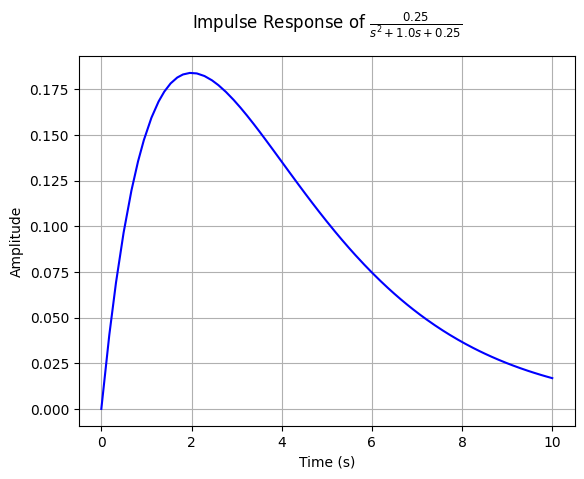

In [25]:
impulse_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

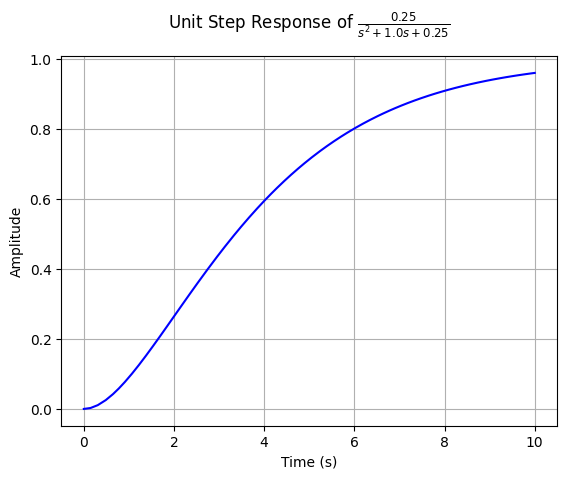

In [26]:
step_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

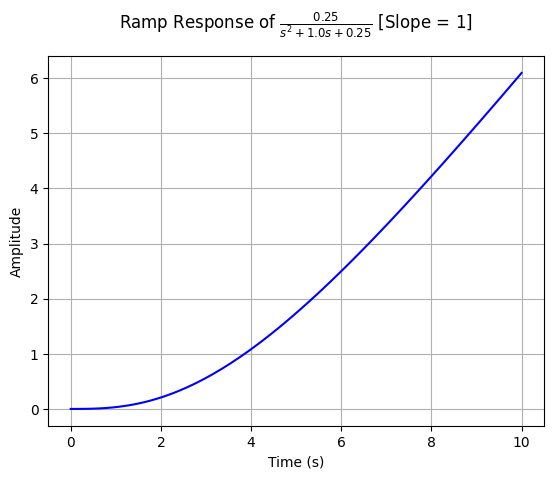

In [27]:
ramp_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

#Función de transferencia para masa resorte amortiguado lazo cerrado

Teniendo en cuenta la forma canónica describe la relación entre la transformada de Laplace de la posición (X(s)) y la transformada de Laplace de la fuerza externa
F(s)) en un sistema masa-resorte-amortiguador con un lazo cerrado de control.

$$HLC(s)=\frac{1}{a_2s^2+a_1s+a_0}$$

$$HLC(s)=K\frac{\omega_n^2}{s^2+2\xi \omega_ns+\omega_n^2}$$

Define los coeficientes
a
2
​
 ,
a
1
​
 , y
a
0
que representan los coeficientes de un sistema de segundo orden,
Calcula la ganancia
K
0
de la forma canónica dividiendo 1 entre
a
0

Calcula la frecuencia natural (
ω
n
​) del sistema de segundo orden.

Calcula el factor de amortiguamiento (
ξ) del sistema de segundo orden.

Define la función de transferencia
(
H(s) en la forma canónica de segundo orden.

In [28]:
#forma canónica del slit
a2 = m #CL en circuito equivalente
a1 = c #L/R en circuito equivalente
ao = k+1 # 1 en circuito equivalente

Ko = 1/ao #ganancia circuito forma canónica
wn = sym.sqrt(ao/a2)
xi = a1/(2*a2*sym.sqrt(ao/a2))
#función de transferencia
H = Ko*wn**2/(s**2+2*xi*wn*s+wn**2)
H

         1          
────────────────────
  ⎛c⋅s    2   k + 1⎞
m⋅⎜─── + s  + ─────⎟
  ⎝ m           m  ⎠

In [29]:
#calcular polos
p1 = -xi*wn + 1j*wn*sym.sqrt(1-xi**2)
p2 = -xi*wn - 1j*wn*sym.sqrt(1-xi**2)
p1

                             ___________________
                            ╱         2         
                _______    ╱         c          
        1.0⋅ⅈ⋅╲╱ k + 1 ⋅  ╱   - ─────────── + 1 
   c                    ╲╱      4⋅m⋅(k + 1)     
- ─── + ────────────────────────────────────────
  2⋅m                      √m                   

Ahora, para sistema subamortiguado:

$$0<\xi<1$$

$$0<\frac{c}{2 m\sqrt{\frac{k+1} {m}}}<1$$

Asumimos:

$$c=1 = \frac{L}{R}$$

$L = 1$, $R=1$

$$k=1$$

$$m=4 = CL$$

$C=4$

$$\xi = \frac{\sqrt{2}}8 =0.17$$

In [30]:
#Reemplazando los valores
mck = {m: 4.0, c: 1.0, k: 1.0}
mck

{c: 1.0, k: 1.0, m: 4.0}

## Polos y ceros

In [31]:
print('p1=',p1.subs(mck))
print('p2=',p2.subs(mck))
print('xi=',xi.subs(mck))
print('omega_n=',wn.subs(mck))

p1= -0.125 + 0.695970545353753*I
p2= -0.125 - 0.695970545353753*I
xi= 0.176776695296637
omega_n= 0.707106781186548


## Tiempo de Establecimiento:

El tiempo de establecimiento (
T
s
​
 ) es una medida que describe cuánto tiempo tarda la respuesta de un sistema en estabilizarse después de una perturbación



calcula el tiempo de establecimiento (
T
s ) para un sistema de segundo orden en el caso de subamortiguamiento. La fórmula utilizada es
T
s
​=
6m/c
, donde
m es la masa del sistema y
c es el coeficiente de amortiguamiento

In [32]:
t_s3 = 6*m / c
print('El tiempo de establecimiento es de: ',t_s3.subs(mck))

El tiempo de establecimiento es de:  24.0000000000000


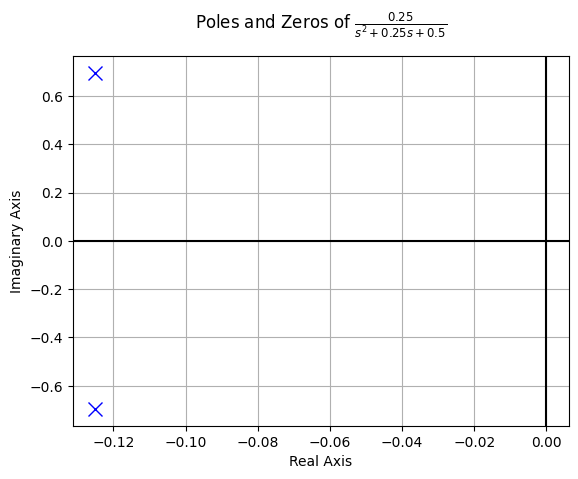

In [33]:
#gráfica polos y ceros paquete de control de sympy
from sympy.physics.control.lti import TransferFunction
from sympy.physics.control.control_plots import pole_zero_plot, bode_plot, impulse_response_plot, step_response_plot
num,den=sym.fraction(H.subs(mck))

tf3 = TransferFunction(num, den, s)#numerados y denomirador función de transferencia con valores evaluados de RLC
pole_zero_plot(tf3)

## Diagrama de Bode

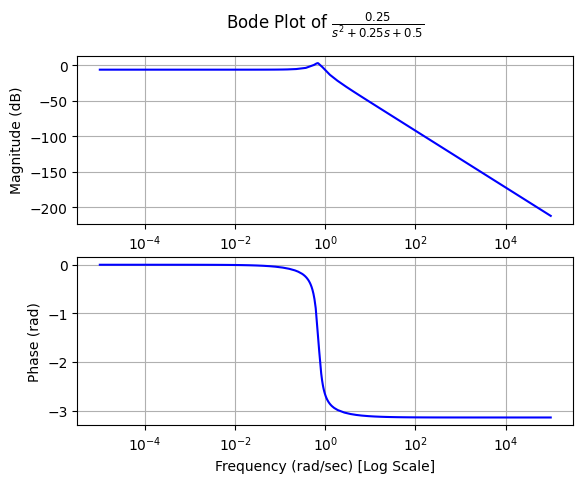

In [34]:
bode_plot(tf3)

## Respuesta impulso

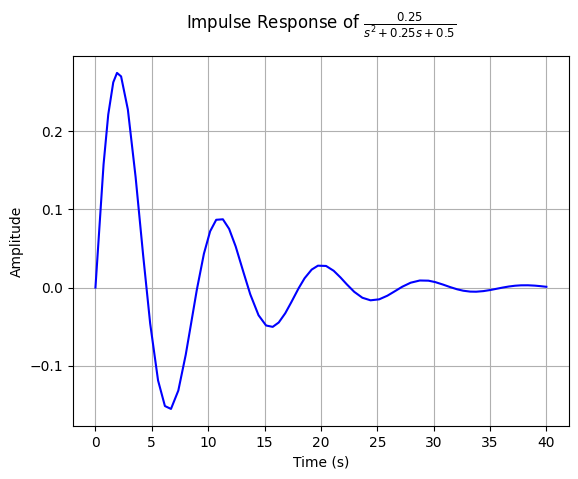

In [35]:
impulse_response_plot(tf3,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

Se utiliza para calcular la respuesta al impulso de un sistema definido por una función de transferencia. Luego, identifica los picos en la respuesta y determina el tiempo del primer pico.

In [36]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import impulse, find_peaks

# Suponiendo que tf1 es tu función de transferencia
# (asegúrate de tener importada la función transfer_function)

# Definir la función de transferencia (sustituye tf1 con tu función)
numerator = [1]
denominator = [4, 1, 2]  # Sistema de segundo orden, por ejemplo

# Obtener la respuesta al impulso
time, response = impulse((numerator, denominator))

# Encontrar los picos en la respuesta al impulso
peaks, _ = find_peaks(response)

# Encontrar el tiempo correspondiente al primer pico
Tp = time[peaks[0]]
Tp

2.262626262626263

# Respuesta al escalón

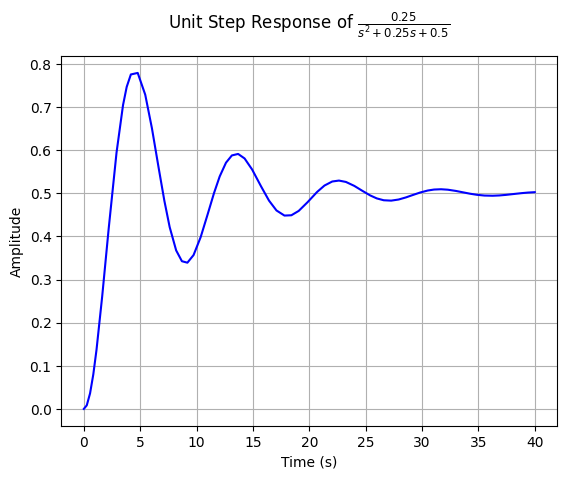

In [37]:
step_response_plot(tf3,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

In [38]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import step, find_peaks

# Suponiendo que tf1 es tu función de transferencia
# (asegúrate de tener importada la función transfer_function)

# Definir la función de transferencia (sustituye tf1 con tu función)
numerator = [1]
denominator = [4, 1, 2]  # Sistema de segundo orden, por ejemplo

# Obtener la respuesta al impulso
time, response = step((numerator, denominator))

# Encontrar los picos en la respuesta al impulso
peaks, _ = find_peaks(response)

# Encontrar el tiempo correspondiente al primer pico
Tp = time[peaks[0]]
Tp

4.525252525252526

## Respuesta Rampa

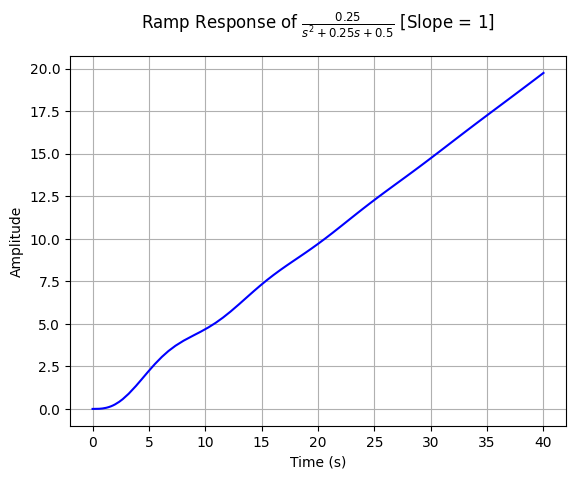

In [39]:
ramp_response_plot(tf3,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

Ahora, para sistema de amortiguamiento crítico cumple con la condición de amortiguamiento crítico (
ξ=1). Este conjunto de parámetros define completamente tu sistema masa-resorte-amortiguador y te permite analizar su respuesta dinámica

$$\xi=1$$

$$\frac{c}{2 m\sqrt{\frac{k+1} {m}}}=1$$

Asumimos:

$$c=4 = \frac{L}{R}$$

$L = 8$, $R=2$

$$k=1$$

$$m=2 = CL$$

$C=\frac{1}{4}$

$$\xi = \frac{4}{4}=1$$

In [40]:
#Reemplazando los valores
mck = {m: 2.0, c: 4.0, k: 1.0}
mck

{c: 4.0, k: 1.0, m: 2.0}

## Polos y ceros

In [41]:
print('p1=',p1.subs(mck))
print('p2=',p2.subs(mck))
print('xi=',xi.subs(mck))
print('omega_n=',wn.subs(mck))

p1= -1.00000000000000
p2= -1.00000000000000
xi= 1.00000000000000
omega_n= 1.00000000000000


## Tiempo de Establecimiento:

In [42]:
t_s4 = 6*m / c
print('El tiempo de establecimiento es de: ',t_s4.subs(mck))

El tiempo de establecimiento es de:  3.00000000000000


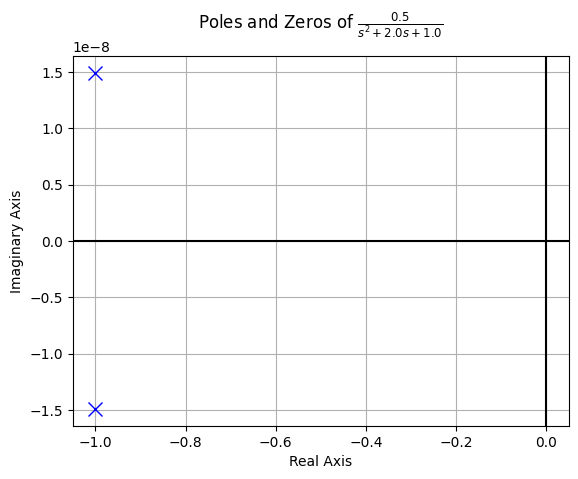

In [43]:
#gráfica polos y ceros paquete de control de sympy
from sympy.physics.control.lti import TransferFunction
from sympy.physics.control.control_plots import pole_zero_plot, bode_plot, impulse_response_plot, step_response_plot
num,den=sym.fraction(H.subs(mck))

tf4 = TransferFunction(num, den, s)#numerados y denomirador función de transferencia con valores evaluados de RLC
pole_zero_plot(tf4)

## Diagrama de Bode

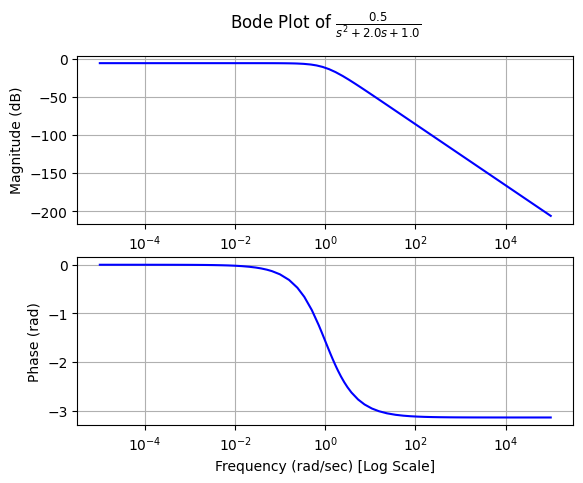

In [44]:
bode_plot(tf4)

## Respuesta impulso

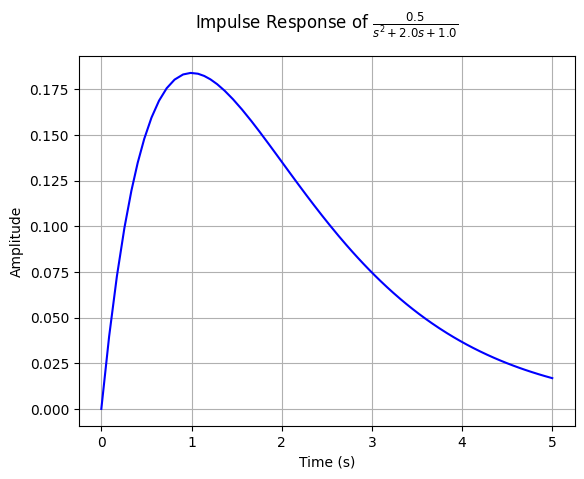

In [45]:
impulse_response_plot(tf4,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

In [46]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import impulse, find_peaks

# Suponiendo que tf1 es tu función de transferencia
# (asegúrate de tener importada la función transfer_function)

# Definir la función de transferencia (sustituye tf1 con tu función)
numerator = [1]
denominator = [2, 4, 1]  # Sistema de segundo orden, por ejemplo

# Obtener la respuesta al impulso
time, response = impulse((numerator, denominator))

# Encontrar los picos en la respuesta al impulso
peaks, _ = find_peaks(response)

# Encontrar el tiempo correspondiente al primer pico
Tp = time[peaks[0]]
Tp

1.207045198818771

# Respuesta al escalón

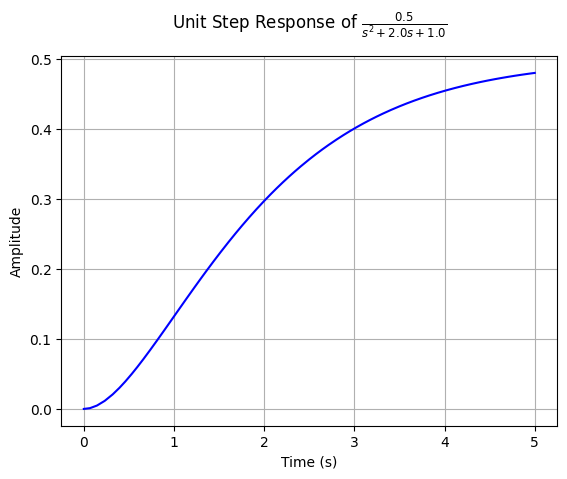

In [47]:
step_response_plot(tf4,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

## Respuesta Rampa

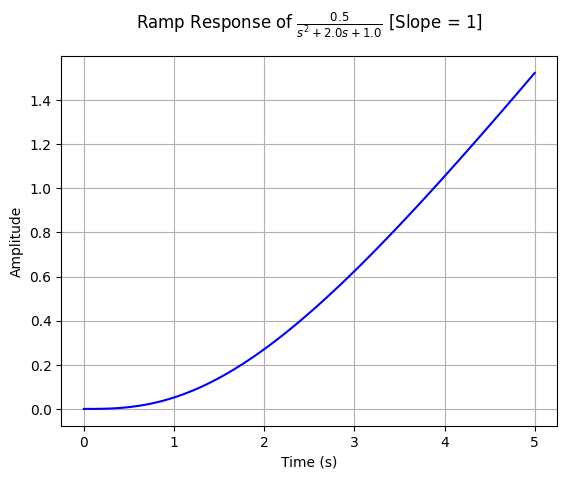

In [48]:
ramp_response_plot(tf4,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))


2. Sea el demodulador en amplitud presentado
en la siguiente Figura:

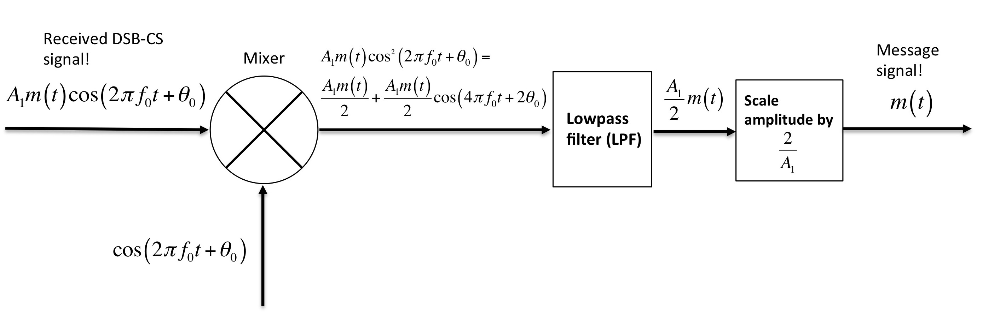


Asumiendo  $\theta_0 = 0$, determine el espectro en cada una de las etapas del sistema. Luego, con base a la simulacion de
la modulacion en amplitud del parcial 2 (utilizando una cancion de Youtube), grafique cada una de las etapas principales del proceso de modulacion y demodulacion en el tiempo y la frecuencia (reproduzca el segmento de la cancion en cada etapa). Nota: para la etapa de filtrado pasa bajas, presente
el diseño del filtro y su implementacion a partir de la transformada Z utilizando un modelo Butterworth, Bessel y
Chebyshev.

Importamos librerias a utilizar

In [49]:
import soundfile as sf
import scipy
import numpy as np

from scipy.signal import butter
from scipy.signal import cheby1
from scipy.signal import bessel
from scipy.signal import lfilter, filtfilt
from IPython.display import Markdown as md
from IPython.display import Audio
from matplotlib import pyplot as plt
from matplotlib.patches import Circle

In [50]:
!python3 -m pip install --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 23.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 57.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130.2 kB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.5/162.5 kB 18.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.6/62.6 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.6/104.6 kB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 50.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 142.1/142.1 kB 14.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.6/61.6 kB 7.6 MB/s eta 0:00:00
  Created w

Permite descargar un video de YouTube como un archivo de audio MP3, y puedes llamarla proporcionando la URL del video y un nombre para el archivo resultante.

In [51]:
import os
import yt_dlp as youtube_dl
def download_ytvid_as_mp3(video_url,name):
    #video_url = input("enter url of youtube video:")
    video_info = youtube_dl.YoutubeDL().extract_info(url = video_url,download=False)
    filename = f"{name}.mp3"
    options={
        'format':'bestaudio/best',
        'keepvideo':False,
        'outtmpl':filename,
    }

    with youtube_dl.YoutubeDL(options) as ydl:
        ydl.download([video_info['webpage_url']])

    print("Download complete... {}".format(filename))


In [52]:
link_= ["https://www.youtube.com/watch?v=zSKEwdM-U9s"]
name_ = ['Ancho PR - Bad Bunny & mas artistas'
        ]
for name,link in zip(name_,link_):
    print(name)
    download_ytvid_as_mp3(link,name)


Ancho PR - Bad Bunny & mas artistas
[youtube] Extracting URL: https://www.youtube.com/watch?v=zSKEwdM-U9s
[youtube] zSKEwdM-U9s: Downloading webpage
[youtube] zSKEwdM-U9s: Downloading ios player API JSON
[youtube] zSKEwdM-U9s: Downloading android player API JSON
[youtube] zSKEwdM-U9s: Downloading m3u8 information
[youtube] Extracting URL: https://www.youtube.com/watch?v=zSKEwdM-U9s
[youtube] zSKEwdM-U9s: Downloading webpage
[youtube] zSKEwdM-U9s: Downloading ios player API JSON
[youtube] zSKEwdM-U9s: Downloading android player API JSON
[youtube] zSKEwdM-U9s: Downloading m3u8 information
[info] zSKEwdM-U9s: Downloading 1 format(s): 251
[download] Destination: Ancho PR - Bad Bunny & mas artistas.mp3
[download] 100% of    6.14MiB in 00:00:00 at 22.84MiB/s  
Download complete... Ancho PR - Bad Bunny & mas artistas.mp3


In [53]:
# Instalamos la extensión soundfile
!pip install soundfile

Convertir archivos de audio MP3 a formato WAV utilizando ffmpeg

In [54]:
import subprocess

for name in name_:
    subprocess.call(['ffmpeg','-y', '-i', name+'.mp3',
                   name+'.wav'])

Leer archivos de audio en formato WAV, realiza algunas operaciones relacionadas con el audio y luego utiliza la biblioteca pydub para reproducir el segmento seleccionado del audio original.

In [55]:
import soundfile as sf # para instalar pip install soundfile
for name in name_:
    nombre_out = "output.wav"
    x, fs = sf.read(name+'.wav')

    print('Frecuencia de muestreo %.2f[Hz]\naudio %s' % (fs,name+'.wav'))

print('Frecuencia de muestreo %.2f[Hz]' %(fs))
xpro = x.copy()


inicial = int(input("Ingrese el tiempo inicial de la canción"))
final =  int(input("Ingrese el tiempo inicial de la canción"))

corte1 = int(input("Ingrese la frecuencia de corte inferior para el filtro pasa bandas"))
corte2 = int(input("Ingrese la frecuencia de corte superior para el filtro pasa bandas"))

ti = inicial
tf = final
xs = xpro[int(ti*fs):int((tf*fs)),:]
K= int(len(xs)/2) + 1
print(f'Audio original:')
Audio([xs[:,1], xs[:,0]],rate=fs) #segmento de audio

Frecuencia de muestreo 48000.00[Hz]
audio Ancho PR - Bad Bunny & mas artistas.wav
Frecuencia de muestreo 48000.00[Hz]
Ingrese el tiempo inicial de la canción20
Ingrese el tiempo inicial de la canción30
Ingrese la frecuencia de corte inferior para el filtro pasa bandas1000
Ingrese la frecuencia de corte superior para el filtro pasa bandas5000
Audio original:


# ***MODULACIÓN***
La modulación se refiere al proceso de modificar una señal portadora en función de otra señal llamada moduladora.

Extrayendo la señal de mensaje de un segmento específico de la señal de audio en el primer canal.

In [56]:
m = xpro[int(ti*fs):int((tf*fs)),0] #señal mensaje en primer canal

La gráfica resultante mostrará cómo varía la señal de mensaje a lo largo del tiempo en el intervalo específico que se ha seleccionado.

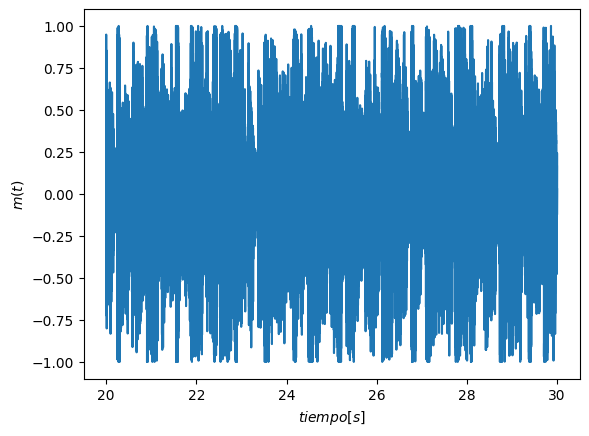

In [57]:
#Señal mensaje en tiempo y frecuencia
tt = np.arange(ti,tf,1/fs) # vector de tiempo
plt.plot(tt,m) #graficar señal mensaje en el tiempo
plt.xlabel('$tiempo [s]$')
plt.ylabel('$m(t)$')
plt.show()

Estas gráficas proporcionan información sobre cómo se distribuyen las frecuencias en la señal de mensaje, tanto en términos de magnitud como de fase. La primera gráfica muestra la magnitud del espectro, mientras que la segunda muestra la fase.

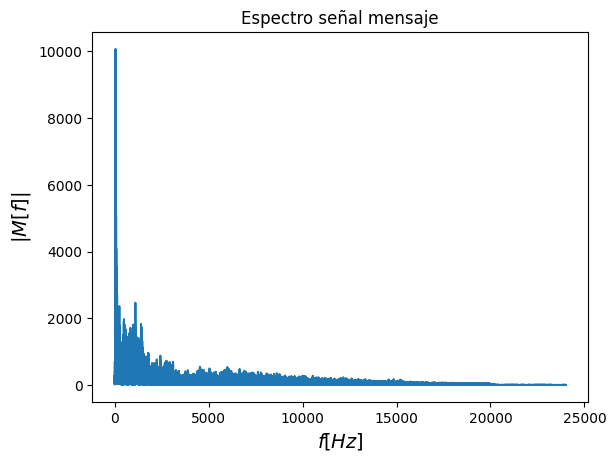

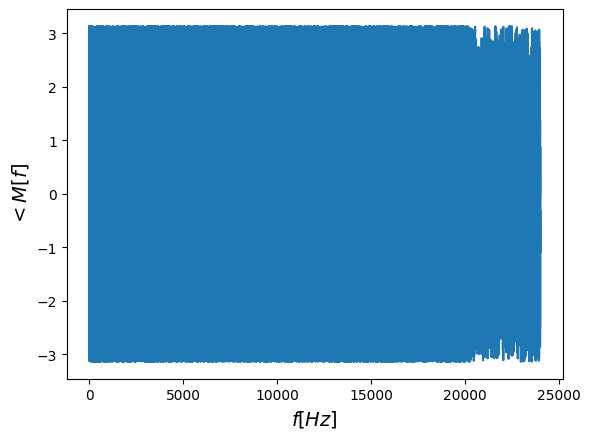

In [58]:
#Fourier señal mensaje
Mw = np.fft.rfft(m) # axis=0 permite aplicar fft por cada columna de xpro
vf = np.fft.rfftfreq(m.shape[0],1/fs) #se crea el vector de frecuencias
plt.plot(vf,abs(Mw))#se grafica la magnitud
plt.title(r'Espectro señal mensaje')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|M[f]|$',fontsize = 14)
plt.show()

plt.plot(vf, np.angle(Mw))#fase del espectro
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$<M[f]$',fontsize = 14)
plt.show()

 Para que se cumpla nyquist  $$F_o > F_{max}$$ \\

 para nuestro caso: $$F_o=15000 [Hz]$$
 Establece que la frecuencia de muestreo (
F
o
​
 ) debe ser al menos el doble de la frecuencia máxima presente en la señal (
F
max
​
 ) para evitar el aliasing y permitir una reconstrucción adecuada de la señal.




Se genera una señal portadora
c(t) que puede ser utilizada en un esquema de modulación de amplitud (AM) junto con la señal de mensaje para producir la señal modulada. La señal portadora tiene una frecuencia de
15000

Hz
15000Hz, como se ha especificado.

In [59]:
Fo = 15000 #frecuencia portadora
c = np.cos(2*np.pi*Fo*tt) #portadora

In [60]:
#repoducir portadora
Audio(c,rate=fs)

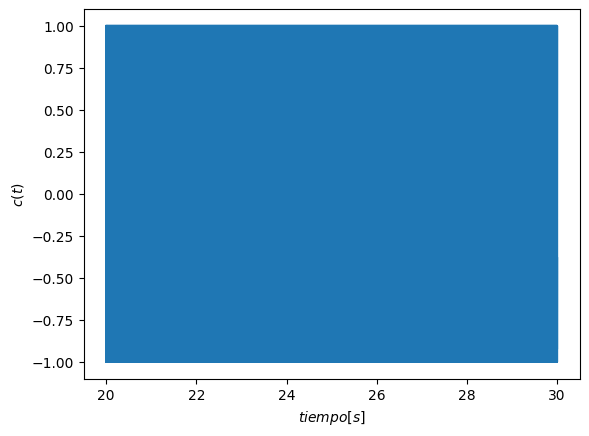

In [61]:
#Señal portadora en tiempo y frecuencia
plt.plot(tt,c) #graficar señal mensaje en el tiempo
plt.xlabel('$tiempo [s]$')
plt.ylabel('$c(t)$')
plt.show()

Se genera una representación gráfica de la señal de la portadora en el dominio del tiempo utilizando matplotlib. El eje x representa el tiempo, el eje y representa el valor de la señal de la portadora en ese momento.

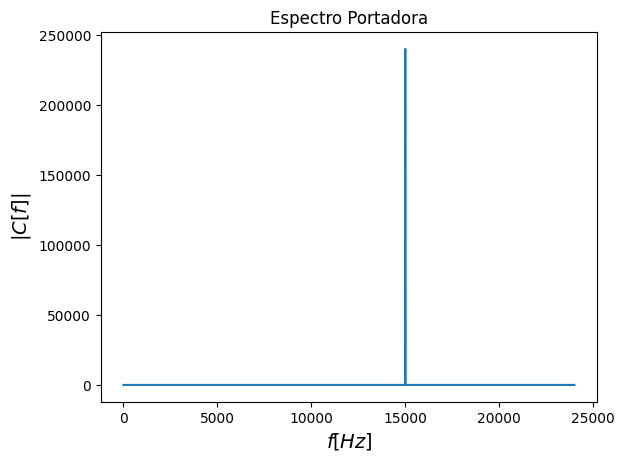

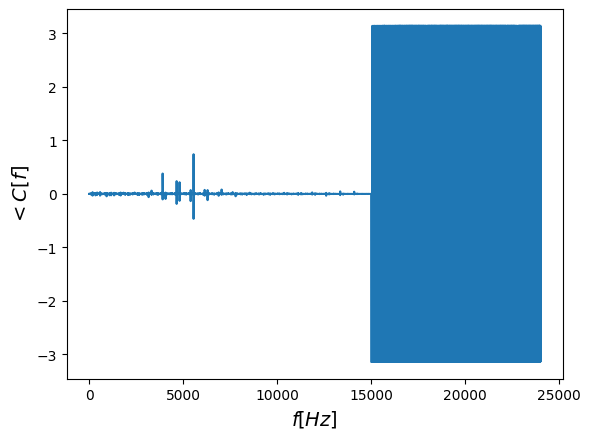

In [62]:
#Fourier señal portadora
Cw = np.fft.rfft(c) # axis=0 permite aplicar fft por cada columna de xpro
plt.plot(vf,abs(Cw))#se grafica la magnitud
plt.title(r'Espectro Portadora')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|C[f]|$',fontsize = 14)
plt.show()


plt.plot(vf, np.angle(Cw))#fase del espectro
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$<C[f]$',fontsize = 14)
plt.show()

La variable y contiene la señal modulada en amplitud, que es el resultado de multiplicar la señal de mensaje por la señal de portadora y ajustar su amplitud.

In [63]:
#señal modulada
A1 = 2
y = A1*m*c #señal modulada en AM

Se reproducirá la señal modulada en amplitud a través del sistema, permitiéndote escuchar cómo suena la señal modulada.

In [64]:
#repoducir modulada
Audio(y,rate=fs)

Se genera una representación gráfica de la señal modulada en amplitud en el dominio del tiempo utilizando matplotlib. El eje x representa el tiempo, y el eje y representa el valor de la señal modulada en amplitud en ese momento

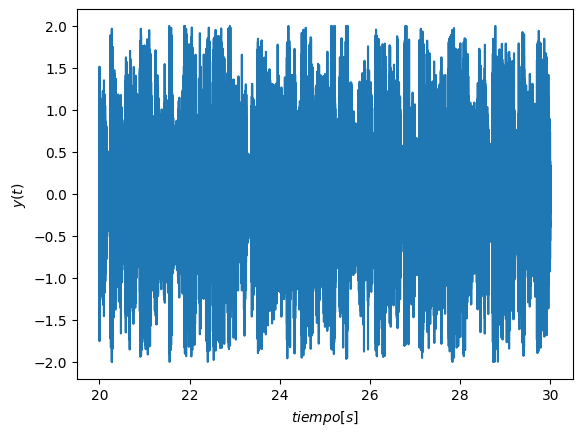

In [65]:
# Señal modulada en tiempo y frecuencia
plt.plot(tt,y) #graficar señal modulada en el tiempo
plt.xlabel('$tiempo [s]$')
plt.ylabel('$y(t)$')
plt.show()

Las gráficas proporcionan información sobre cómo se distribuyen las frecuencias en la señal modulada en amplitud, tanto en términos de magnitud como de fase.

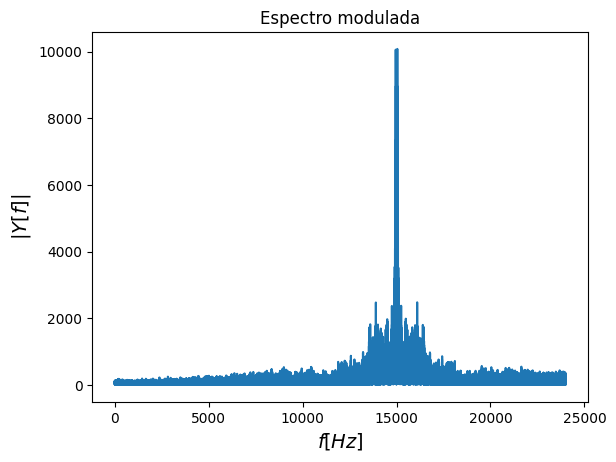

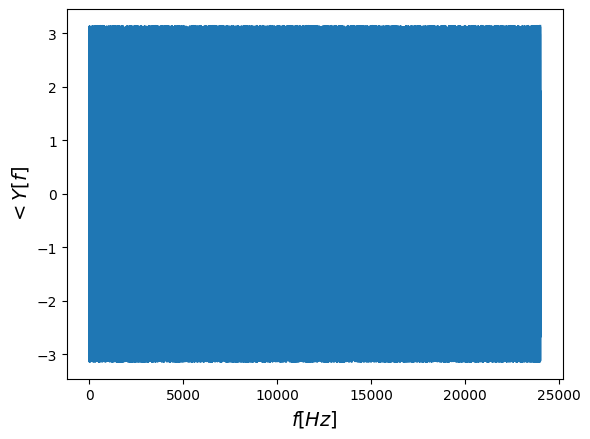

In [66]:
#Fourier señal modulada
Yw = np.fft.rfft(y) # axis=0 permite aplicar fft por cada columna de xpro
plt.plot(vf,abs(Yw))#se grafica la magnitud
plt.title(r'Espectro modulada')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|Y[f]|$',fontsize = 14)
plt.show()


plt.plot(vf, np.angle(Yw))#fase del espectro
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$<Y[f]$',fontsize = 14)
plt.show()

## Demodulación
La demodulación es el proceso inverso de la modulación. Implica extraer la información original de una señal modulada.

Se realiza la demodulación de dos señales (y y c) multiplicándolas para obtener la señal demodulada d.

In [67]:
d = y*c #señal demodulada

#repoducir señal demodulada
Audio(d,rate=fs)

Se utiliza la transformada rápida de Fourier (FFT) para analizar el espectro de frecuencia de una señal demodulada.

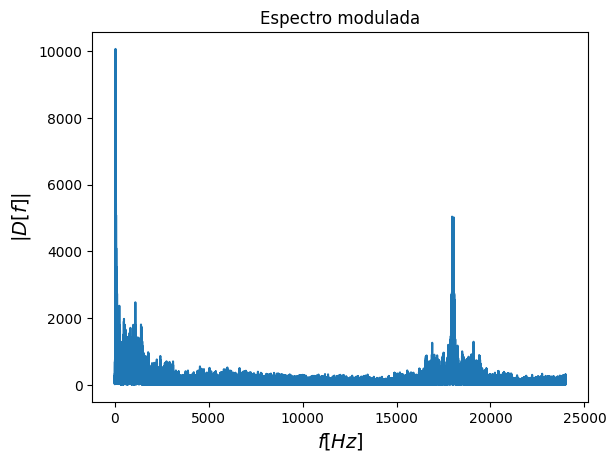

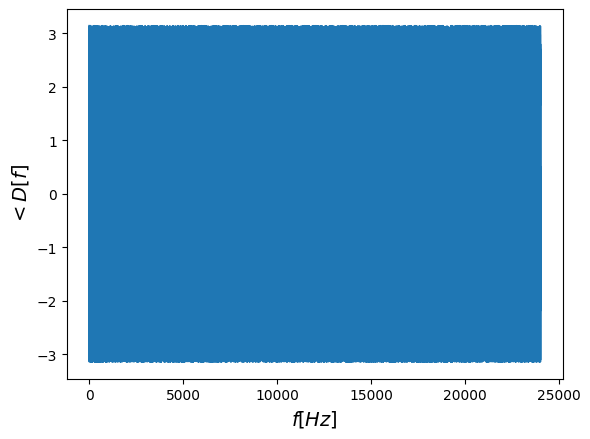

In [68]:
#Fourier señal demodulada
Dw = np.fft.rfft(d) # axis=0 permite aplicar fft por cada columna de xpro
plt.plot(vf,abs(Dw))#se grafica la magnitud
plt.title(r'Espectro modulada')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|D[f]|$',fontsize = 14)
plt.show()


plt.plot(vf, np.angle(Dw))#fase del espectro
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$<D[f]$',fontsize = 14)
plt.show()

## Filtrado de la señal
Se utilza para eliminar o atenuar ciertas frecuencias no deseadas o para resaltar ciertos componentes de interés en la señal. Hay varios tipos de filtros, como pasa bajo, pasa alto, pasa banda, y rechaza banda, cada uno diseñado para dejar pasar ciertas frecuencias y atenuar otras.

***Filtro Butterworth***

 Sus principales características incluyen una respuesta de frecuencia plana en la banda de paso, diseño simple, y una respuesta al escalón sin oscilaciones notables.

In [69]:
#Filtro Butterworth
print("Escriba el tipo de filtrado que desea hacer según las siguientes instrucciones")
print("Filtrado paso bajo: lowpass",
      "Filtrado paso alto: highpass",
      "Filtrado pasa banda: bandpass"
      "Filtrado rechaza banda: bandstop")

filtrado = str(input("Ingrese el nombre del tipo de filtrado tal como se indica en la tabla: "))
N_orden= int(input("Ingrese el orden del filtro: "))

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
elif filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]

num, den = butter(N_orden, Wn=wn, btype=filtrado, output='ba',fs=fs)

xf = filtfilt(num, den, xs, axis=0)
print('Audio filtrado')
Audio([xf[:,1], xf[:,0]],rate=fs)

Escriba el tipo de filtrado que desea hacer según las siguientes instrucciones
Filtrado paso bajo: lowpass Filtrado paso alto: highpass Filtrado pasa banda: bandpassFiltrado rechaza banda: bandstop
Ingrese el nombre del tipo de filtrado tal como se indica en la tabla: lowpass
Ingrese el orden del filtro: 1
Audio filtrado


Se permite visualizar cómo se distribuyen las frecuencias en la señal filtrada para cada canal.

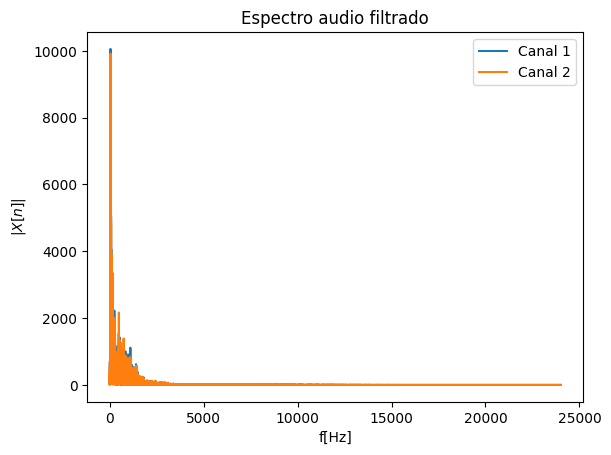

In [70]:
#Espectro con el filtro

xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0) # fft por cada columna de xpro
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

***Filtro Chebyshev I***

Es un tipo específico de filtro que permite ondulaciones controladas en la banda de paso, lo que le permite lograr una transición más rápida entre la banda de paso y la banda de rechazo.

In [71]:
# Filtro Chebyshev I
print("Escriba el tipo de filtrado que desea hacer según las siguientes instrucciones")
print("Filtrado paso bajo: lowpass",
      "Filtrado paso alto: highpass",
      "Filtrado pasa banda: bandpass"
      "Filtrado rechaza banda: bandstop")

filtrado = str(input("Ingrese el nombre del tipo de filtrado tal como se indica en la tabla: "))
N_orden = int(input("Ingrese el orden del filtro: "))
ripple = int(input("Ingrese el orden ripple del filtro: "))

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
elif filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]

num, den=cheby1(N_orden, rp=ripple, Wn=wn, btype=filtrado, output='ba', fs=fs)

xf = filtfilt(num, den, xs, axis=0)
print('Audio filtrado')
Audio([xf[:,1], xf[:,0]],rate=fs)

Escriba el tipo de filtrado que desea hacer según las siguientes instrucciones
Filtrado paso bajo: lowpass Filtrado paso alto: highpass Filtrado pasa banda: bandpassFiltrado rechaza banda: bandstop
Ingrese el nombre del tipo de filtrado tal como se indica en la tabla: highpass
Ingrese el orden del filtro: 2
Ingrese el orden ripple del filtro: 2
Audio filtrado


Se permite visualizar cómo se distribuyen las frecuencias en la señal filtrada para cada canal.

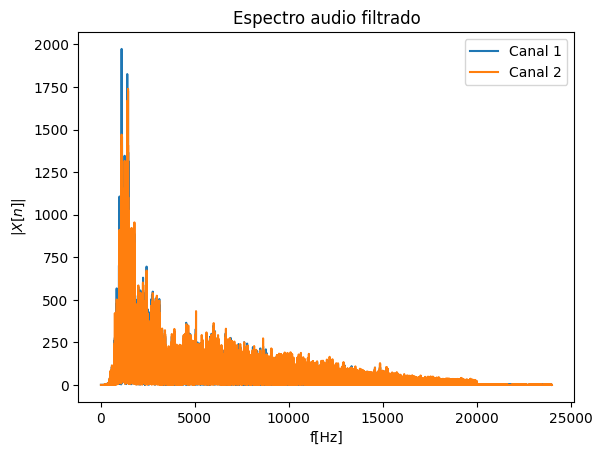

In [72]:
#Espectro con el filtro

xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0)
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

## ***Filtro Bessel***

Su principal ventaja radica en la preservación de la relación temporal entre las componentes de la señal.

In [75]:
#Filtro Bessel
print("Escriba el tipo de filtrado que desea hacer según las siguientes instrucciones")
print("Filtrado paso bajo: lowpass",
      "Filtrado paso alto: highpass",
      "Filtrado pasa banda: bandpass"
      "Filtrado rechaza banda: bandstop")

filtrado = str(input("Ingrese el nombre del tipo de filtrado tal como se indica en la tabla"))
N_orden = int(input("Ingrese el orden del filtro"))
normali="mag"

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
if filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]
num, den = bessel(N_orden, wn, btype=filtrado, output='ba', norm = normali, fs=fs)

xf = filtfilt(num, den, xs, axis=0)
print('Audio filtrado:')
Audio([xf[:,1], xf[:,0]],rate=fs)

Escriba el tipo de filtrado que desea hacer según las siguientes instrucciones
Filtrado paso bajo: lowpass Filtrado paso alto: highpass Filtrado pasa banda: bandpassFiltrado rechaza banda: bandstop
Ingrese el nombre del tipo de filtrado tal como se indica en la tablabandstop
Ingrese el orden del filtro3
Audio filtrado:


Se permite visualizar cómo se distribuyen las frecuencias en la señal filtrada para cada canal.

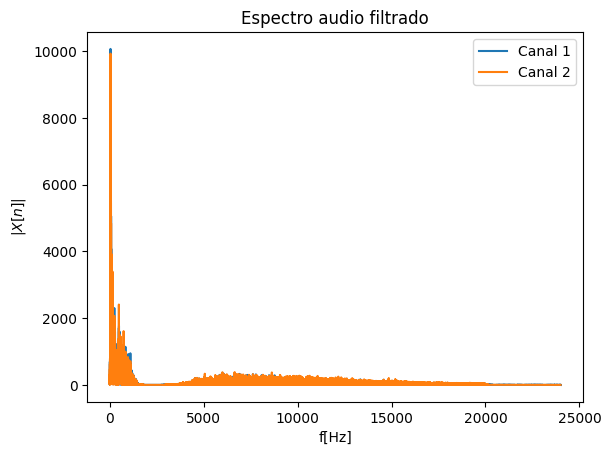

In [76]:
#Espectro con el filtro

xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0)
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()